Задача 1:
Используя API VK (https://vk.com/dev), загрузить все фотографии (указанного размера) из всех альбомов указанной группы. За основу взять скрипт из вложения.

In [161]:
from urllib.request import urlretrieve
import vk_api, os, time, math

In [162]:
# авторизация при помощи токена
session = vk_api.VkApi(token='5ef95e7f5ef95e7f5ef95e7f5c5ddf123355ef95ef95e7f39a27f1e8d51e361f20fb093')
vkapi = session.get_api()

In [163]:
# поиск ID группы по короткому имени
screen_name = "talitimes"
response = vkapi.utils.resolveScreenName(screen_name=screen_name)
group_id = -response["object_id"]

# получаем доступ к альбому
albums = vkapi.photos.getAlbums(owner_id=group_id)['items']
# проверяем список альбомов
for album in albums:
    print(album['title'])

Конкурс урожаев 2023
Окаменелости и то, что на них похоже.
Main album
Фотограф Анатолий Васильев
Фотоконкурс 2023
Фауна
Ваши фото


In [164]:
# создание папки для групп
if not os.path.exists('saved'):
    os.mkdir('saved')

group_folder = f'saved/group_{abs(group_id)}'
if not os.path.exists(group_folder):
    os.mkdir(group_folder)

In [165]:
for album in albums:
    counter = 0
    prog = 0
    breaked = 0

    album_id = album["id"]
    album_title = album["title"].replace("/", "_")
    album_folder = os.path.join(group_folder, f"album_{album_id}_{album_title}")
    
    if not os.path.exists(album_folder):
        os.mkdir(album_folder)
    
    photos_count = album["size"]

    print(f"Начинается загрузка альбома: {album_title}")
    for j in range(math.ceil(photos_count / 1000)):
        photos = vkapi.photos.get(owner_id=group_id, album_id=album_id, count=1000, offset=j * 1000)
        for photo in photos["items"]:
            counter += 1
            prog = round(100 / photos_count * counter, 2)
            url = photo["sizes"][0]["url"]
            print('Загружаю фото № {} из {}. Прогресс: {} %'.format(counter, photos_count, prog))
            try:
                urlretrieve(url, os.path.join(album_folder, str(counter) + ".jpg"))
            except Exception as e:
                print(f'Произошла ошибка: {e}. Файл пропущен.')
                breaked += 1
                continue

Начинается загрузка альбома: Конкурс урожаев 2023
Загружаю фото № 1 из 13. Прогресс: 7.69 %
Загружаю фото № 2 из 13. Прогресс: 15.38 %
Загружаю фото № 3 из 13. Прогресс: 23.08 %
Загружаю фото № 4 из 13. Прогресс: 30.77 %
Загружаю фото № 5 из 13. Прогресс: 38.46 %
Загружаю фото № 6 из 13. Прогресс: 46.15 %
Загружаю фото № 7 из 13. Прогресс: 53.85 %
Загружаю фото № 8 из 13. Прогресс: 61.54 %
Загружаю фото № 9 из 13. Прогресс: 69.23 %
Загружаю фото № 10 из 13. Прогресс: 76.92 %
Загружаю фото № 11 из 13. Прогресс: 84.62 %
Загружаю фото № 12 из 13. Прогресс: 92.31 %
Загружаю фото № 13 из 13. Прогресс: 100.0 %
Начинается загрузка альбома: Окаменелости и то, что на них похоже.
Загружаю фото № 1 из 7. Прогресс: 14.29 %
Загружаю фото № 2 из 7. Прогресс: 28.57 %
Загружаю фото № 3 из 7. Прогресс: 42.86 %
Загружаю фото № 4 из 7. Прогресс: 57.14 %
Загружаю фото № 5 из 7. Прогресс: 71.43 %
Загружаю фото № 6 из 7. Прогресс: 85.71 %
Загружаю фото № 7 из 7. Прогресс: 100.0 %
Начинается загрузка альбома

Задача 2.
Анализ групп VK
1. Выбрать две группы ВК для исследования (более 1000 подписчиков). Проанализировать данные об их подписчиках (возраст, пол и т.д.).
2. Разработать методику сравнения групп между собой (пересечение пользователей, регион и т.д.). Построить иллюстрирующие графики.
3. Визуализировать граф (NetworkX — NetworkX documentation) пользователей групп из пункта 1.

- https://vk.com/itedunetwork (Сетевой ИТ-Университет), 5971 участник
- https://vk.com/uralsp (Спортивное программирование на Урале), 4867 участников

In [166]:
# функция для получения участников группы
def get_members(group_id, total_count):
    members = []
    offset = 0
    while offset <= total_count:
        response = vkapi.groups.getMembers(group_id=group_id, sort='id_asc', count=1000, offset=offset, fields=['sex', 'bdate', 'city', 'country'])
        members += response['items']
        offset += 1000
    return members

In [167]:
import pandas as pd
from datetime import datetime

In [168]:
total_count_itedu, total_count_uralsp = 6000, 5000
members_itedu, members_uralsp = get_members('itedunetwork', total_count_itedu), get_members('uralsp', total_count_uralsp)

In [169]:
df_itedu = pd.DataFrame(members_itedu)
df_uralsp = pd.DataFrame(members_uralsp)

In [170]:
df_itedu['Пол'] = df_itedu['sex'].replace({0: 'Не указан', 1: 'Женский', 2: 'Мужской'})
df_uralsp['Пол'] = df_uralsp['sex'].replace({0: 'Не указан', 1: 'Женский', 2: 'Мужской'})
df_uralsp.head()

,id,bdate,city,sex,first_name,last_name,can_access_closed,is_closed,deactivated,Пол
0,969,16.7,"{'id': 2, 'title': 'Saint Petersburg'}",1,Anastasia,Grigoryeva,False,True,NaN,Женский
1,5333,22.2.1989,"{'id': 2, 'title': 'Saint Petersburg'}",2,Sergey,Kopeliovich,False,True,NaN,Мужской
2,27385,NaN,NaN,2,Sergey,Biletov,True,False,NaN,Мужской
3,32684,NaN,"{'id': 72, 'title': 'Krasnodar'}",1,Sasha,Snegireva,False,True,NaN,Женский
4,34496,31.7,"{'id': 1743, 'title': 'Kirishi'}",2,Anton,Melnikov,True,False,NaN,Мужской


In [171]:
# пол
sex_dist_itedu = df_itedu['Пол'].value_counts()
sex_dist_uralsp = df_uralsp['Пол'].value_counts()

print("Распределение по полу \"Сетевой ИТ-Университет\":")
print(sex_dist_itedu, '\n')
print("Распределение по полу \"Спортивное программирование на Урале\":")
print(sex_dist_uralsp, '\n')

# средний возраст
df_itedu['birth_date'] = pd.to_datetime(df_itedu['bdate'], errors='coerce', format='%d.%m.%Y')
df_uralsp['birth_date'] = pd.to_datetime(df_uralsp['bdate'], errors='coerce', format='%d.%m.%Y')

avg_age_itedu = (pd.Timestamp.now() - pd.to_datetime(df_itedu['birth_date'])).mean().days // 365
avg_age_uralsp = (pd.Timestamp.now() - pd.to_datetime(df_uralsp['birth_date'])).mean().days // 365

print(f"Средний возраст \"Сетевой ИТ-Университет\": {avg_age_itedu}")
print(f"Средний возраст \"Спортивное программирование на Урале\": {avg_age_uralsp}", '\n')

# город
top_cities_itedu = df_itedu['city'].apply(lambda x: x['title'] if pd.notna(x) else x).value_counts().head(7)
top_cities_uralsp = df_uralsp['city'].apply(lambda x: x['title'] if pd.notna(x) else x).value_counts().head(7)

print("Топ городов \"Сетевой ИТ-Университет\":")
print(top_cities_itedu, '\n')
print("Топ городов \"Спортивное программирование на Урале\":")
print(top_cities_uralsp, '\n')

Распределение по полу "Сетевой ИТ-Университет":
Пол
Женский      3772
Мужской      2196
Не указан       3
Name: count, dtype: int64 

Распределение по полу "Спортивное программирование на Урале":
Пол
Мужской    2620
Женский    2247
Name: count, dtype: int64 

Средний возраст "Сетевой ИТ-Университет": 34
Средний возраст "Спортивное программирование на Урале": 32 

Топ городов "Сетевой ИТ-Университет":
city
Perm                3590
Moscow               101
Saint Petersburg      62
Berezniki             62
Solikamsk             41
Chaykovsky            41
Lysva                 32
Name: count, dtype: int64 

Топ городов "Спортивное программирование на Урале":
city
Yekaterinburg       1694
Moscow               217
Saint Petersburg     134
Kamensk-Uralsky      115
Chelyabinsk           97
Novouralsk            58
Perm                  53
Name: count, dtype: int64 



In [172]:
# количество общих участников
common_members_info = pd.merge(df_itedu, df_uralsp, on='id', suffixes=('_itedu', '_uralsp'))
common_members_count = len(common_members_info['id'])

print(f"Количество общих участников: {common_members_count}", '\n')

# информация об общих участниках
common_columns = ['id', 'Пол_itedu', 'birth_date_itedu', 'city_itedu']
common_members_info = common_members_info[common_columns]
common_members_info.head()
     

Количество общих участников: 39 



,id,Пол_itedu,birth_date_itedu,city_itedu
0,140141,Мужской,1981-06-29,"{'id': 110, 'title': 'Perm'}"
1,2692706,Женский,NaT,"{'id': 110, 'title': 'Perm'}"
2,6761508,Мужской,NaT,NaN
3,7584944,Женский,NaT,NaN
4,12871336,Женский,NaT,"{'id': 110, 'title': 'Perm'}"


In [173]:
# пол
sex_distribution_common = common_members_info['Пол_itedu'].value_counts()
print(sex_distribution_common, '\n')

# возраст
avg_age_common = (pd.Timestamp.now() - common_members_info['birth_date_itedu']).mean().days // 365
print(f"Средний возраст: {avg_age_common}", '\n')

# города
top_cities_common = common_members_info['city_itedu'].apply(lambda x: x['title'] if pd.notna(x) else x).value_counts()
print(top_cities_common)

Пол_itedu
Мужской    20
Женский    19
Name: count, dtype: int64 

Средний возраст: 32 

city_itedu
Perm               16
Kueda (poselok)     1
Severodvinsk        1
Chusovoy            1
Kungur              1
Moscow              1
Name: count, dtype: int64


In [174]:
import matplotlib.pyplot as plt
import seaborn as sns

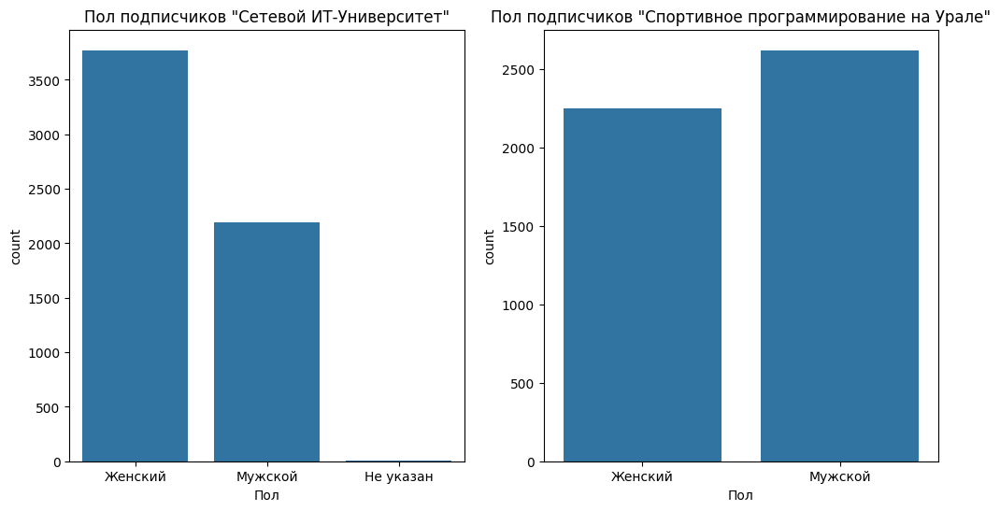

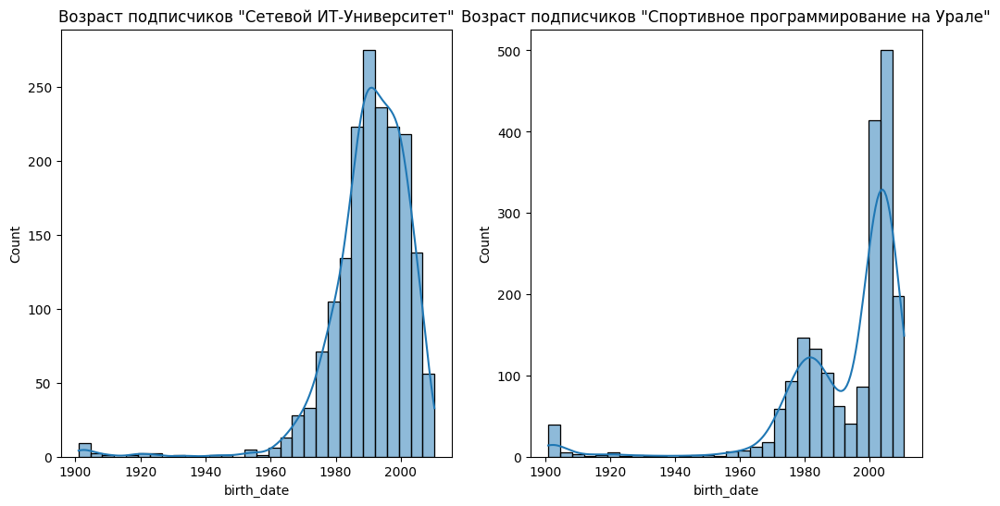

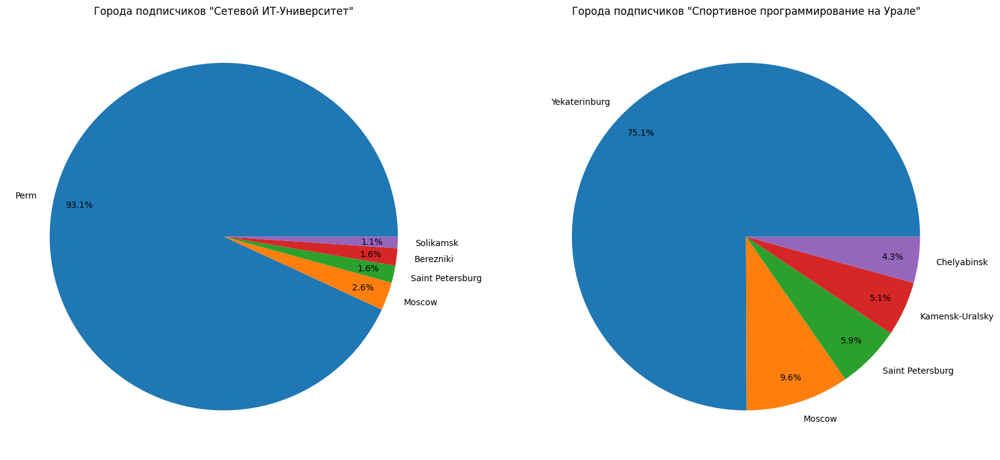

In [181]:
# визуализация распределения по полу
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.countplot(x='Пол', data=df_itedu)
plt.title('Пол подписчиков \"Сетевой ИТ-Университет\"')

plt.subplot(1, 2, 2)
sns.countplot(x='Пол', data=df_uralsp)
plt.title('Пол подписчиков \"Спортивное программирование на Урале\"')

# визуализация распределения по возрасту
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(df_itedu['birth_date'].dropna(), bins=30, kde=True)
plt.title('Возраст подписчиков \"Сетевой ИТ-Университет\"')

plt.subplot(1, 2, 2)
sns.histplot(df_uralsp['birth_date'].dropna(), bins=30, kde=True)
plt.title('Возраст подписчиков \"Спортивное программирование на Урале\"')

# визуализация распределения по городам
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
top_cities_itedu = df_itedu['city'].apply(lambda x: x['title'] if pd.notna(x) else x).value_counts().head()
plt.pie(top_cities_itedu, labels=top_cities_itedu.index, autopct='%1.1f%%', pctdistance=0.85, startangle=1800)
plt.title('Города подписчиков \"Сетевой ИТ-Университет\"')

plt.subplot(1, 2, 2)
top_cities_uralsp = df_uralsp['city'].apply(lambda x: x['title'] if pd.notna(x) else x).value_counts().head()
plt.pie(top_cities_uralsp, labels=top_cities_uralsp.index, autopct='%1.1f%%', pctdistance=0.85, startangle=1800)
plt.title('Города подписчиков \"Спортивное программирование на Урале\"')

plt.show()

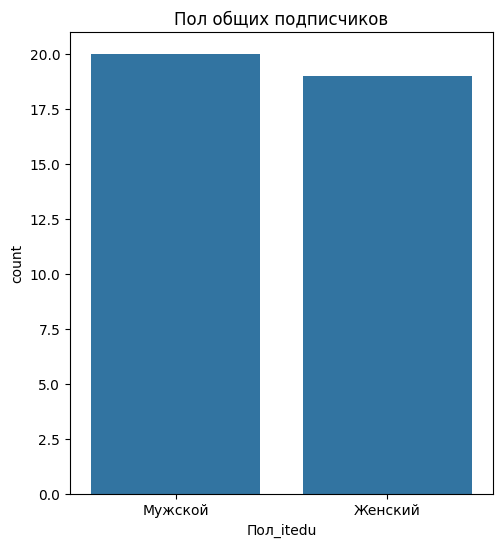

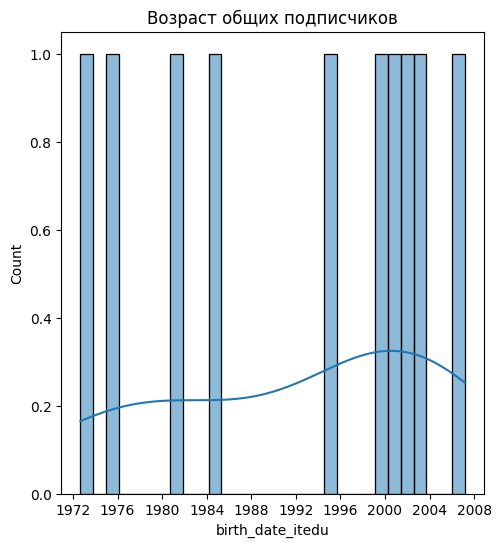

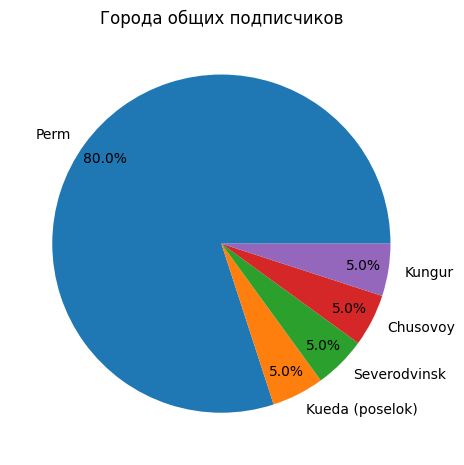

In [189]:
# пол общих подписчиков
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.countplot(x='Пол_itedu', data=common_members_info)
plt.title('Пол общих подписчиков')

# возраст общих подписчиков
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(common_members_info['birth_date_itedu'].dropna(), bins=30, kde=True)
plt.title('Возраст общих подписчиков')

# города общих подписчиков
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
common_cities = common_members_info['city_itedu'].apply(lambda x: x['title'] if pd.notna(x) else x).value_counts().head()
plt.pie(common_cities, labels=common_cities.index, autopct='%1.1f%%', pctdistance=0.85, startangle=1800)
plt.title('Города общих подписчиков')

plt.show()

In [190]:
import networkx as nx

In [194]:
df_itedu_subset = df_itedu.head(600)
df_uralsp_subset = df_uralsp.head(600)
common_members_info_subset = common_members_info.head(600)
G = nx.Graph()
G.add_nodes_from(["itedu"], group='itedu')
G.add_nodes_from(["uralsp"], group='uralsp')
G.add_nodes_from(df_itedu_subset['id'], group='itedu_subs')
G.add_nodes_from(df_uralsp_subset['id'], group='uralsp_subs')
common_user_ids = common_members_info_subset['id']
common_edges_itedu = [("itedu", user_id) for user_id in common_user_ids]
common_edges_uralsp = [("uralsp", user_id) for user_id in common_user_ids]
G.add_edges_from([("itedu", user_id) for user_id in df_itedu_subset['id']])
G.add_edges_from([("uralsp", user_id) for user_id in df_uralsp_subset['id']])
G.add_edges_from(common_edges_itedu)
G.add_edges_from(common_edges_uralsp)
plt.figure(figsize=(100, 70))
pos = nx.spring_layout(G)
node_colors = ['green' if node in common_user_ids else 'blue' if group == 'itedu' or group == 'itedu_subs' else 'red' if group == 'uralsp' or group == 'uralsp_subs' else "green" for node, group in G.nodes(data='group')]
nx.draw(G, pos, node_color=node_colors, with_labels=True)
plt.show()